![{980x350}](RUN_4.jpg)

### Table of Contents

* Intro: Questions and search directions
    * Proxies for successful listings
    * Technical stack
    

* 1. Visualizing data on the map
    * 1.1 Dataset and setup
    * 1.2 Visualization on the map using Folium
    

* 2. Exploring calendar data
    * 2.1 Dataset and setup
    * 2.2 Visualization on the map using Folium
    

* 3. Exploring reviews
    * 3.1 Ratings repartition
    * 3.2 Comments over time
    * 3.3 Exploring with bags of words
        * 3.3.1 Bag of words: Bad reviews
        * 3.3.2 Bag of words: Good reviews
        

* 4. Exploring amenities
    * 4.1 Preparing amenities dataset
    * 4.2 Exploring amenities potential impact on reviews, ratings & price
        * 4.2.1 Amenities popularity
        * 4.2.2 Amenities ranked by number of reviews
        * 4.2.3 Amenities ranked by ratings
        * 4.2.4 Amenities ranked by price

# Questions and search directions

We now have a the structured database below and a handful of questions that need answers (not exhaustive):
 - What is the market like in terms of types of homes, number of guests, amenities ? 
 - What are the most successful listings and what is special about them ? 
 - What is a successful listing ? 
 - What can we learn from reviews about what makes a good or bad stay at a airbnb ? 
 - Did Covid have an impact on the number of rentals ? 
 - What's the average price for a stay on Reunion Island ? Can we explain price differences ? 
 - Where are the listings on the map ? Are there enough lisitngs everywhere on the Island ?
 - Where are the areas with the most competition ?
 - How many different listings do people go to ? 
 - ...

As a reminder, the database we were able to build in the previous stage: 

![{550x650}](database.png)

## Proxies for successful listings: 

From a host perspective a successful rental is one that maximizes profitability (occupancy rate * price - costs) with the following possible proxies:
 - number of reviews
 - ratings (in particular value for money rating)
 - price per night  
 - price per night per bed 
 - price per night per guest
 - booking rate
 
From a guest perspective a successful rental is one with a good value for money:
 - value for money rating

## Technical stack

We are going to use **python** and some useful libraries to carry out the EDA **(pandas,matplotlib,geopandas,folium...)**.

First we need to get the data from mysql to a pandas dataframe thanks to **pymysql**. 

#### Pymysql function to query the database 

In [1]:
import numpy as np
import pandas as pd
import pymysql as mysql
from pymysql import Error

In [2]:
def query_database(my_query):
    my_password = '@AfMysql%72'
    my_host = '127.0.0.1'
    database_name = "run_airbnb_db"
    try:
        connection = mysql.connect(user='root', password=my_password, database=database_name, host=my_host)
        if connection:
            cursor = connection.cursor()
            cursor.execute(my_query)
            result = pd.DataFrame(cursor.fetchall())
            cursor.close()
            connection.close()
            columns = cursor.description
            column_headers=[column[0] for column in columns]
            print(column_headers)
            result.columns = column_headers
    except Error as e:
        print("Error while connecting to mysql:", e)
        result = pd.DataFrame("")
    return result

# 1. Visualizing data on the map

## 1.1 Let's first create a dataset encompassing the main information about each listing by merging some of the tables:
- first we want the features of a listing (number of rooms, beds, capacity, type, amenities...) from table listing details 
- then the ratings given by guests (table ratings)
- finally we can complete the dataset with geographical data (table iris)

The join between listings_details & ratings needs to be a left join as some listings don't have a comment or rating yet and would otherwise be omitted 

In [3]:
my_query="select d.listing_id,d.reviewsCount,d.is_SuperHost,d.lat,d.lng,d.CODE_IRIS,i.NOM_COM,i.NOM_IRIS,"\
         "CASE WHEN d.housingType ='' THEN d.roomTypeCategory2 ELSE d.housingType END as housing_Type,"\
         "d.personCapacity, d.num_chambres,d.num_lits,d.num_sdb,"\
         "r.num_amenities,r.amenities,r.pictureCount,r.accuracyRating,r.checkinRating,r.cleanlinessRating,"\
         "r.communicationRating,r.guestSatisfactionOverall,r.valueRating,r.locationRating"\
             " from listings_details d"\
                 " left join ratings r on d.listing_id=r.listing_id"\
                 " join iris i on d.CODE_IRIS=i.CODE_IRIS;"

In [4]:
main_df=query_database(my_query)

['listing_id', 'reviewsCount', 'is_SuperHost', 'lat', 'lng', 'CODE_IRIS', 'NOM_COM', 'NOM_IRIS', 'housing_Type', 'personCapacity', 'num_chambres', 'num_lits', 'num_sdb', 'num_amenities', 'amenities', 'pictureCount', 'accuracyRating', 'checkinRating', 'cleanlinessRating', 'communicationRating', 'guestSatisfactionOverall', 'valueRating', 'locationRating']


In [5]:
main_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3066 entries, 0 to 3065
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   listing_id                3066 non-null   int64  
 1   reviewsCount              3066 non-null   int64  
 2   is_SuperHost              3066 non-null   object 
 3   lat                       3066 non-null   object 
 4   lng                       3066 non-null   object 
 5   CODE_IRIS                 3066 non-null   object 
 6   NOM_COM                   3066 non-null   object 
 7   NOM_IRIS                  3066 non-null   object 
 8   housing_Type              3066 non-null   object 
 9   personCapacity            3066 non-null   int64  
 10  num_chambres              3066 non-null   int64  
 11  num_lits                  3066 non-null   int64  
 12  num_sdb                   3066 non-null   float64
 13  num_amenities             2946 non-null   float64
 14  amenitie

#### Before adding data regarding price we need to engineer the features introduced earlier, namely:
 - price per night  
 - price per night per bed 
 - price per night per guest

Here for simplicity's sake we choose to compare the listings in terms of price when they are booked **at maximum capacity** (we could have chosen a more complex proxy as the fees vary with the number of guests

##### We first compute the full price by adding the night rate and fees 

In [6]:
prices_df=query_database("select * from prices")
prices_df['complete_price_per_night']=(prices_df['nightly_price']*prices_df['num_nights']+prices_df['cleaning_fees']+prices_df['service_fees']+prices_df['stay_tax'])/prices_df['num_nights']   
prices_df['complete_price_per_night_per_pers']=(prices_df['nightly_price']*prices_df['num_nights']+prices_df['cleaning_fees']+prices_df['service_fees']+prices_df['stay_tax'])/prices_df['num_guests']/prices_df['num_nights']   
prices_df.info()

['listing_id', 'nightly_price', 'cleaning_fees', 'service_fees', 'stay_tax', 'computation', 'total_price', 'num_guests', 'num_nights']
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11994 entries, 0 to 11993
Data columns (total 11 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   listing_id                         11994 non-null  int64  
 1   nightly_price                      11994 non-null  float64
 2   cleaning_fees                      11994 non-null  float64
 3   service_fees                       11994 non-null  float64
 4   stay_tax                           11994 non-null  float64
 5   computation                        11994 non-null  object 
 6   total_price                        11994 non-null  float64
 7   num_guests                         11994 non-null  float64
 8   num_nights                         11994 non-null  float64
 9   complete_price_per_night           11994 non-nu

##### We then find the maximum capacity for each listing (we could also have joined the listings_details table as this information already exists there)

In [7]:
grouped_df=prices_df.groupby('listing_id')['num_guests'].max()
grouped_df.info()

<class 'pandas.core.series.Series'>
Int64Index: 2946 entries, 1004534 to 53233447
Series name: num_guests
Non-Null Count  Dtype  
--------------  -----  
2946 non-null   float64
dtypes: float64(1)
memory usage: 46.0 KB


##### Finally we only keep the price for the max capacity

In [8]:
prices_df=prices_df.merge(grouped_df, on=['listing_id','num_guests'])
prices_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2946 entries, 0 to 2945
Data columns (total 11 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   listing_id                         2946 non-null   int64  
 1   nightly_price                      2946 non-null   float64
 2   cleaning_fees                      2946 non-null   float64
 3   service_fees                       2946 non-null   float64
 4   stay_tax                           2946 non-null   float64
 5   computation                        2946 non-null   object 
 6   total_price                        2946 non-null   float64
 7   num_guests                         2946 non-null   float64
 8   num_nights                         2946 non-null   float64
 9   complete_price_per_night           2946 non-null   float64
 10  complete_price_per_night_per_pers  2946 non-null   float64
dtypes: float64(9), int64(1), object(1)
memory usage: 276.2+ 

##### We can now add the price information to our main dataset

In [9]:
main_df=main_df.merge(prices_df,on=['listing_id'])
main_df.drop('complete_price_per_night',axis=1,inplace=True)

##### Average price per night

In [10]:
avg_price=prices_df.groupby('listing_id')['complete_price_per_night'].mean()
avg_price.info()

<class 'pandas.core.series.Series'>
Int64Index: 2946 entries, 1004534 to 53233447
Series name: complete_price_per_night
Non-Null Count  Dtype  
--------------  -----  
2946 non-null   float64
dtypes: float64(1)
memory usage: 46.0 KB


In [11]:
main_df=main_df.merge(avg_price,on=['listing_id'])
main_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2946 entries, 0 to 2945
Data columns (total 33 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   listing_id                         2946 non-null   int64  
 1   reviewsCount                       2946 non-null   int64  
 2   is_SuperHost                       2946 non-null   object 
 3   lat                                2946 non-null   object 
 4   lng                                2946 non-null   object 
 5   CODE_IRIS                          2946 non-null   object 
 6   NOM_COM                            2946 non-null   object 
 7   NOM_IRIS                           2946 non-null   object 
 8   housing_Type                       2946 non-null   object 
 9   personCapacity                     2946 non-null   int64  
 10  num_chambres                       2946 non-null   int64  
 11  num_lits                           2946 non-null   int64

## 1.2 Let's now try to get a sense of the market by visulazing key features (number of listings...) on the map

In [12]:
import folium
import geopandas

##### Loading French IRIS Data

In [13]:
iris_gdf = geopandas.read_file('../CONTOURS-IRIS_2-1_SHP_RGR92UTM40S_REU-2021/CONTOURS-IRIS.shp')

##### Dataset for vizualisation on map (selecting main features to display)

In [14]:
visualization_df=main_df[['CODE_IRIS','NOM_IRIS','listing_id','locationRating','complete_price_per_night_per_pers','reviewsCount']]
visualization_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2946 entries, 0 to 2945
Data columns (total 6 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   CODE_IRIS                          2946 non-null   object 
 1   NOM_IRIS                           2946 non-null   object 
 2   listing_id                         2946 non-null   int64  
 3   locationRating                     2566 non-null   float64
 4   complete_price_per_night_per_pers  2946 non-null   float64
 5   reviewsCount                       2946 non-null   int64  
dtypes: float64(2), int64(2), object(2)
memory usage: 161.1+ KB


##### We need to aggregate data per geographical area

In [15]:
folium_df=visualization_df.groupby("CODE_IRIS").agg(
    num_listings=("listing_id", "count"),
    num_reviews=("reviewsCount", "sum"),
    avg_reviews=("reviewsCount", np.mean),
    avg_location_rating  =("locationRating", np.mean),
    avg_price=("complete_price_per_night_per_pers",np.mean),
    
)

##### Here we compute mean on the whole dataset for number of reviews and price in order to detect a contribution of the geographical area on those factors (reviews_contrib & price_contrib)

In [16]:
avg_reviews_overall=visualization_df['reviewsCount'].mean()
avg_reviews_overall

23.267820773930755

In [17]:
avg_price_overall=visualization_df['complete_price_per_night_per_pers'].mean()
avg_price_overall

32.46548009646925

In [18]:
folium_df['reviews_contrib']=folium_df['avg_reviews']-avg_reviews_overall
folium_df['price_contrib']=folium_df['avg_price']-avg_price_overall
folium_df=folium_df.round({'avg_reviews': 0, 'avg_location_rating': 2,'avg_price':0,'reviews_contrib':1,'price_contrib':1})
# folium_df.round(1)
folium_df.reset_index(inplace=True)
folium_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 246 entries, 0 to 245
Data columns (total 8 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   CODE_IRIS            246 non-null    object 
 1   num_listings         246 non-null    int64  
 2   num_reviews          246 non-null    int64  
 3   avg_reviews          246 non-null    float64
 4   avg_location_rating  240 non-null    float64
 5   avg_price            246 non-null    float64
 6   reviews_contrib      246 non-null    float64
 7   price_contrib        246 non-null    float64
dtypes: float64(5), int64(2), object(1)
memory usage: 15.5+ KB


### Create a reusable function for choropleth map creation (Folium)

In [19]:
def create_choropleth(data,columns,bins,fields,legend_name,title):
    # Centers the map on Reunion Island and initialize map
    center = [-21.127597, 55.545888]
    my_map = folium.Map(location=center)

    # Data (abnb data) and geodata (Iris geometries and data) to use in Choropleth
    data = data
    geo_data = iris_gdf[['geometry', 'CODE_IRIS','NOM_COM', 'NOM_IRIS']]

    # Let's merge the 2 to be able to use abnb data in labels 
    merged = geo_data.merge(data, on='CODE_IRIS')

    # Create Choropleth map, as we merged the 2 datasets only the geometries (Iris) with data in both datasets will be displayed
    my_Choropleth_map=folium.Choropleth(
        geo_data=merged,
        name="choropleth",
        data=data,
        columns=columns,
        key_on='feature.properties.CODE_IRIS',
        bins=bins,
        fill_color="OrRd",
        fill_opacity=0.7,
        line_opacity=0.3,
        nan_fill_color="grey",
        nan_fill_opacity=0.7,
        legend_name=legend_name,
        highlight=True
    ).add_to(my_map)


    folium.features.GeoJsonTooltip(fields=fields, aliases=None, labels=True, localize=False, style=None,
                                   class_name='foliumtooltip', sticky=True).add_to(my_Choropleth_map.geojson)

    folium.LayerControl().add_to(my_map)

    my_map.save(f"{title}.html")
    
    return my_map

### Area attractivity based on number of reviews 

In [20]:
columns=["CODE_IRIS", "num_reviews"]
bins=[0,100,500,1500,2500,4000]
fields=['NOM_COM', 'NOM_IRIS', "num_reviews","num_listings"]
legend_name="area attrictivity based on number of reviews"
title="map_reviews"
data=folium_df
create_choropleth(data,columns,bins,fields,legend_name,title)

##### Without much surprise the circuses (center of the Island) and the west coast boast the high numbers of reviews.

### Attractivity and competition based on average number of reviews per listing

In [21]:
columns=["CODE_IRIS", "avg_reviews"]
bins=[0,25,50,100,200]
fields=['NOM_COM', 'NOM_IRIS', "avg_reviews","num_listings"]
legend_name="area attrictivity based on number of reviews per listing"
title="map_reviews_per_listing"
data=folium_df
create_choropleth(data,columns,bins,fields,legend_name,title)

Here we can notice that the competition seems to be fairly well distributed. Some areas though exhibit a higher numbers reviews per listing (le tampon, zone forestière) often with a small offer of listings. **Sign of a lesser competition and a good opportunity for investment ?**

### Area attractivity based on ratings

In [22]:
columns=["CODE_IRIS", "avg_location_rating"]
bins=[3,4.7,4.8,4.9,5]
fields=['NOM_COM', 'NOM_IRIS', "avg_location_rating","num_listings"]
legend_name="area attrictivity based on location ratings"
title="map_ratings"
data=folium_df
create_choropleth(data,columns,bins,fields,legend_name,title)

Here again based on ratings we find that the best stays happen in the touristic part of the Island (west and center). Data is a bit biased as some means are computed only on a few listings and tend to skew the vision. Below is a visualization corrected for small number of listings.

In [23]:
columns=["CODE_IRIS", "avg_location_rating"]
bins=[3,4.7,4.8,4.9,5]
fields=['NOM_COM', 'NOM_IRIS', "avg_location_rating","num_listings"]
legend_name="area attrictivity based on location ratings where more than 5 listings received a review"
data=folium_df[folium_df['num_listings']>5]
title="map_ratings_unbiased"
create_choropleth(data,columns,bins,fields,legend_name,title)

### Intensity of competition based on number of listings 

In [24]:
columns=["CODE_IRIS", "num_listings"]
bins=[0,25,50,100,200,300]
fields=['NOM_COM', 'NOM_IRIS',"num_listings"]
legend_name="area attrictivity based on number of listings"
title="map_num_of_listings"
data=folium_df
create_choropleth(data,columns,bins,fields,legend_name,title)

Here what's surprising is the low offer in Saint Denis, the capital city, in the North as it is the biggest city on the Island, close to the main airport and scored quite well in terms of attractivity in the displays above. **An untapped source of side income ?**

It could be intersting to collect data regarding population to get a better sense of competition in those areas. 

# 2. Exploring calendar data

##### Loading Data

In [25]:
calendar_df=query_database("select * from calendar")
calendar_df.info()

['listing_id', 'month', 'year', 'date', 'available', 'availableForCheckin', 'availableForCheckout', 'bookable']
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1108140 entries, 0 to 1108139
Data columns (total 8 columns):
 #   Column                Non-Null Count    Dtype         
---  ------                --------------    -----         
 0   listing_id            1108140 non-null  int64         
 1   month                 1108140 non-null  int64         
 2   year                  1108140 non-null  int64         
 3   date                  1108140 non-null  datetime64[ns]
 4   available             1108140 non-null  int64         
 5   availableForCheckin   1108140 non-null  int64         
 6   availableForCheckout  1108140 non-null  int64         
 7   bookable              1104915 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(6)
memory usage: 67.6 MB


In [26]:
grouped_by_date =calendar_df.groupby('date')
grouped_by_date['listing_id'].count().value_counts

<bound method IndexOpsMixin.value_counts of date
2021-11-01     332
2021-11-02     332
2021-11-03     332
2021-11-04     332
2021-11-05     332
              ... 
2023-03-27    1507
2023-03-28    1507
2023-03-29    1507
2023-03-30    1507
2023-03-31    1507
Name: listing_id, Length: 516, dtype: int64>

As we can see **the data was not collected correctly** as we did not get the same range of dates which will make it difficult to compare between listings over time or get a sense of the market over time... 

##### Let's now study the availability of listings.

<AxesSubplot:ylabel='Frequency'>

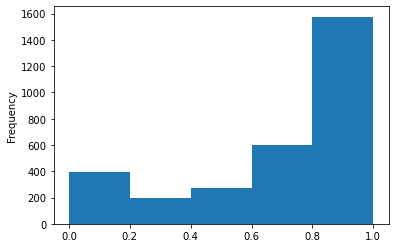

In [27]:
bookability_df=calendar_df.groupby('listing_id').agg(
    bookability_ratio=("bookable", np.mean),
    bookable_days=("bookable", 'sum')
)

bookability_df['bookability_ratio'].plot.hist(bins=5)

##### The feature bookable seems to indicate the days when a listing is open for rental (available or not).  (a ratio of 0 = never put on the market by the host, a ratio of 1 = on the market the whole year) 

A majority of the listings are on the market more than 80% of the year

##### Analysing availablity

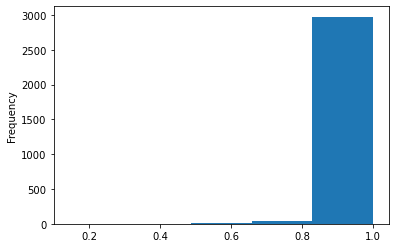

In [28]:
bookable_df=calendar_df[calendar_df['bookable']==1]

availability_df=bookable_df.groupby('listing_id').agg(
    availability_ratio=("availableForCheckin", np.mean),
    bookable_days=("bookable", 'sum')
)

availability_df=availability_df.reset_index()

with pd.option_context('display.max_rows', None,
                       'display.max_columns', None,
                       'display.precision', 3,
                       ):
#     print(availability_df.round(2).sort_values(by=['availability_ratio']))
    availability_df['availability_ratio'].plot.hist(bins=5)

##### Once we take into account only the days a listing is on the market, and looking for the next 12 months, only a small part of listings boast a high occupancy rate.  (WARNING: this ratio is available on the day the data starts to be collected, here the data was collected early november, at the start of the high season)

In [29]:
availability_df[['availability_ratio','bookable_days']].corr()

,availability_ratio,bookable_days
availability_ratio,1.000000,0.472789
bookable_days,0.472789,1.000000


There is a low correlation between the number of bookable days and the availability ratio. Some listings on the market the whole year are already reserved a lot for the coming 12 months.

##### Let's add those features to our main dataframe:

In [30]:
main_df=main_df.merge(availability_df,on=['listing_id'])

Let's dive into the listings with a low availability rate

In [31]:
low_availaility_listings=main_df[(main_df['availability_ratio']<0.7) & (main_df['bookable_days']>250) ]
len(low_availaility_listings)

2

Those 2 listings boast the highest occupancy yet over the next 12 months and should be considered as good benchmarks. 

# 3. Exploring reviews

In [32]:
pip install wordcloud

Note: you may need to restart the kernel to use updated packages.


ERROR: Could not install packages due to an OSError: [Errno 2] No such file or directory: 'c:\\users\\amaur\\anaconda3\\envs\\geop\\lib\\site-packages\\numpy-1.22.2.dist-info\\METADATA'



In [33]:
pip install spacy

Note: you may need to restart the kernel to use updated packages.


ERROR: Could not install packages due to an OSError: [Errno 2] No such file or directory: 'c:\\users\\amaur\\anaconda3\\envs\\geop\\lib\\site-packages\\numpy-1.22.2.dist-info\\METADATA'



In [34]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
from spacy.lang.fr.stop_words import STOP_WORDS as fr_stop
from spacy.lang.en.stop_words import STOP_WORDS as en_stop
from matplotlib.ticker import MaxNLocator

##### Loading Data

In [35]:
reviews_df=query_database("select * from reviews")
reviews_df.info()

['review_id', 'listing_id', 'comments', 'createdAt', 'review_rating', 'reviewee_id', 'reviewee_hostName', 'reviewee_isSuperhost', 'reviewer_id', 'reviewer_hostName', 'reviewer_isSuperhost']
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51207 entries, 0 to 51206
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   review_id             51207 non-null  object        
 1   listing_id            51207 non-null  int64         
 2   comments              51207 non-null  object        
 3   createdAt             51207 non-null  datetime64[ns]
 4   review_rating         51207 non-null  int64         
 5   reviewee_id           51207 non-null  int64         
 6   reviewee_hostName     51207 non-null  object        
 7   reviewee_isSuperhost  51207 non-null  int64         
 8   reviewer_id           51207 non-null  int64         
 9   reviewer_hostName     51207 non-null  object        
 10  

## 3.1 Plotting ratings repartition 

##### Let's first plot how ratings are distributed among the possible ratings from 1 to 5 

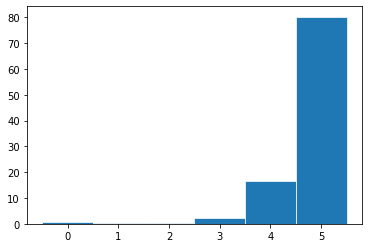

In [36]:
total_reviews=reviews_df['review_id'].count()
percentage_plot=round(reviews_df['review_rating'].value_counts()/total_reviews*100,1)
df = pd.DataFrame(percentage_plot)

df.reset_index(inplace=True)
df = df.rename(columns = {'index':'rating','review_rating':'percentage'})

x = df['rating']
y = df['percentage']
plt.bar(x, y, width=1, edgecolor="white", linewidth=0.7)
plt.show()

As one using Airbnb could exepect, the vast majority of ratings are 4 and 5.

##### Meaning of 0 values 

In [37]:
zeros=reviews_df[reviews_df['review_rating']==0]
len(zeros)

304

##### As we can see the 0 value means that the stay was canceled, those comments change the meaning of the averages and should thus be analysed separately.

In [38]:
not_zeros=reviews_df[reviews_df['review_rating']!=0].copy()
len(not_zeros)

50903

## 3.2 Plotting comments over time

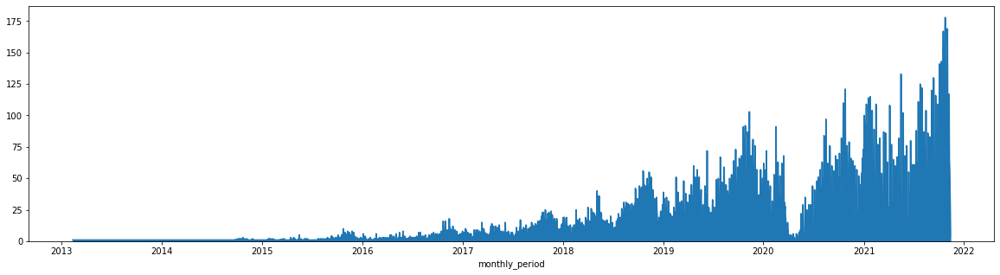

In [39]:
not_zeros['monthly_period'] = not_zeros['createdAt'].dt.date

not_zeros \
    .groupby('monthly_period')['review_id'] \
    .count().plot(kind='area', figsize=(20, 5), stacked=True)
plt.show()

We can observe the impact of Covid 19 in the beginning of 2020 and famous international trail competition 'le grand raid' held in october each year

## 3.3 Exploring with bags of words 

##### Preparing bag of words stop words list

In [40]:
final_stopwords_list = list(fr_stop) + list(en_stop)+["s'est","J'ai","n'est","qu'elle","n'était","Airbnb","Rbnb","n'a","jusqu'aux","m'a","d'une","jusqu'à","n'ai","d'y","séjour","suite","d'elle","l'a","br","Réunion","c'est","y","très","d","d'","très","qu'il","n'y"]

### 3.3.1 Plotting Bad reviews as a bag of words

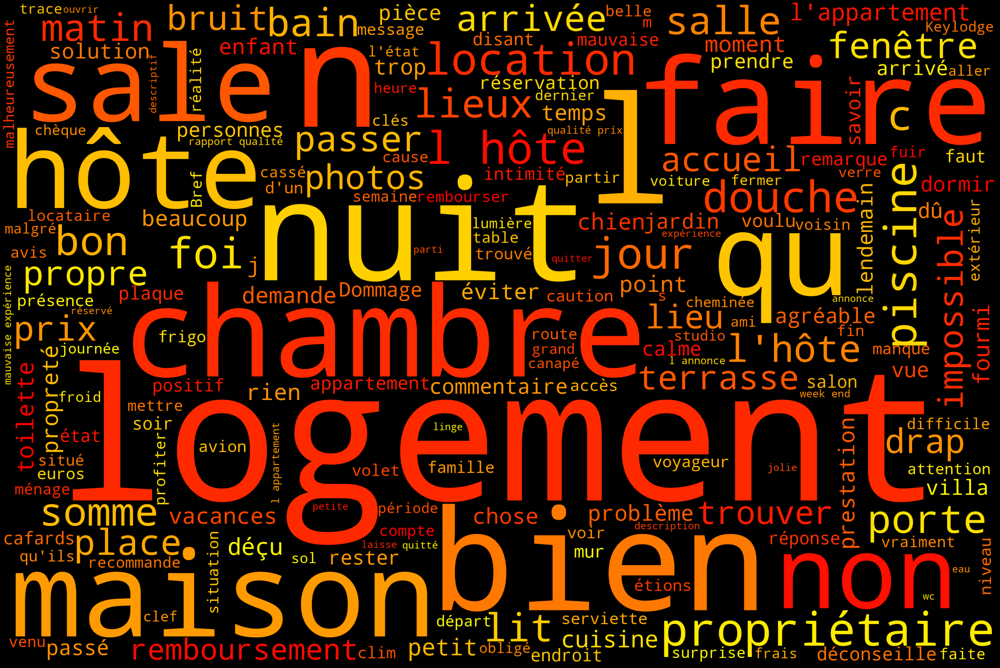

In [41]:
bad_reviews = reviews_df.loc[reviews_df['review_rating'] == 1]
bad_reviews_text = bad_reviews['comments'].str.cat(sep=' ')

wordcloud = WordCloud(
    width=3000,
    height=2000,
    colormap='autumn',
    background_color='black',
    stopwords=final_stopwords_list).generate(bad_reviews_text)

fig = plt.figure(
    figsize=(40, 30),
    facecolor='k',
    edgecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()


### 3.3.2 Plotting Good reviews as a bag of words

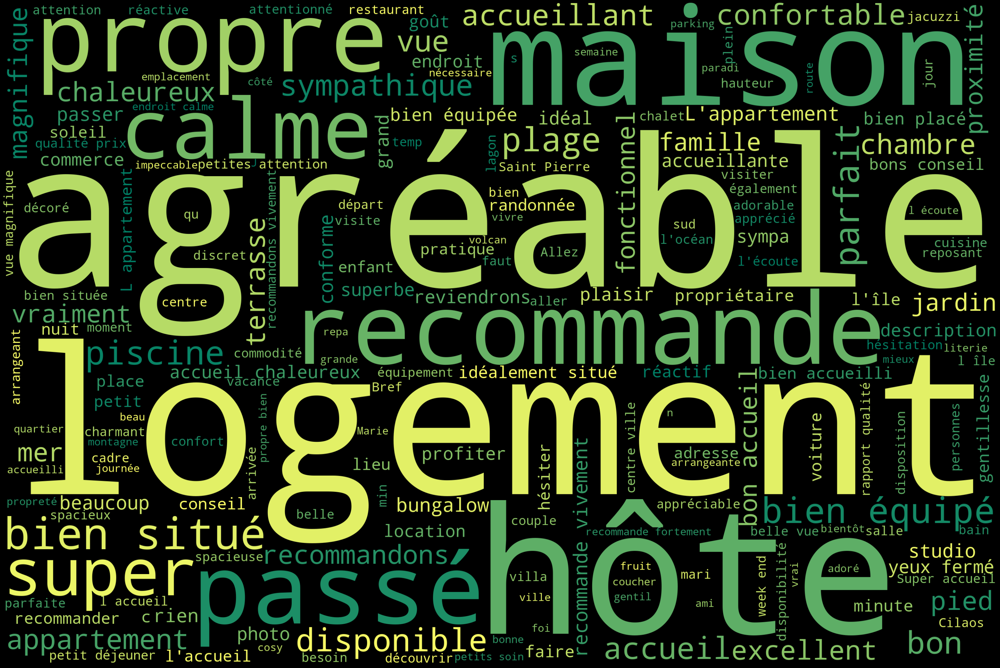

In [42]:
good_reviews = reviews_df.loc[reviews_df['review_rating'] == 5]
good_reviews_text = good_reviews['comments'].str.cat(sep=' ')

wordcloud = WordCloud(
    width=3000,
    height=2000,
    colormap='summer',
    background_color='black',
    stopwords=final_stopwords_list).generate(good_reviews_text)

fig = plt.figure(
    figsize=(40, 30),
    facecolor='k',
    edgecolor='k')
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

#### Reviews insigths

- Bad reviews seems to revolve around **problems with cleanliness (especially the bathrooms and toilets), noise and relations with the host (especially at arrival)**. Those are aspects that can be easily corrected in order to avoid this kind of reviews.


- Good reviews on the other end put the emphasis on **cleanliness, location and amenities**. We've covered location a bit while diplaying the listings on the map. Cleanliness is easily controllable. Amenities is coming nect 

# 4. Exploring amenities

## 4.1 Preparing amenities dataset

In [43]:
amenities_query="select * from listing_amenities l join amenities a on a.id=l.amenity_id;"

In [44]:
amenities_df=query_database(amenities_query)
print(amenities_df.info())

['listing_id', 'amenity_id', 'id', 'name']
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84230 entries, 0 to 84229
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   listing_id  84230 non-null  int64 
 1   amenity_id  84230 non-null  int64 
 2   id          84230 non-null  int64 
 3   name        84230 non-null  object
dtypes: int64(3), object(1)
memory usage: 2.6+ MB
None


In [45]:
temp_df=main_df.copy()
amenities_EDA=amenities_df.merge(temp_df[['listing_id','reviewsCount','complete_price_per_night_per_pers','guestSatisfactionOverall']], on=['listing_id'])

## 4.2 Ranking amenities by number of listings, number of reviews, ratings and price 

In [46]:
grouped_amenities=amenities_EDA.groupby("name").agg(
    num_listings=("listing_id", "count"),
    num_reviews=("reviewsCount", "sum"),
    avg_reviews=("reviewsCount", np.mean),
    avg_price  =("complete_price_per_night_per_pers", np.mean),
    avg_rating=("guestSatisfactionOverall",np.mean), 
)
grouped_amenities.round(2).reset_index().head(5)

,name,num_listings,num_reviews,avg_reviews,avg_price,avg_rating
0,Accès au lac,26,877,33.73,34.38,4.70
1,Accès payant au complexe hôtelier,20,172,8.60,50.31,4.77
2,Accès plage ou bord de mer : Public ou partagé,474,12365,26.09,35.56,4.73
3,Adapté aux événements,232,4504,19.41,31.20,4.64
4,Animaux acceptés,335,7631,22.78,30.17,4.65


### 4.2.1 Popular amenities

In [47]:
sorted_by_listing=grouped_amenities.sort_values(by=['num_listings'])['num_listings']
with pd.option_context('display.max_rows', None,
                       'display.max_columns', None,
                       'display.precision', 3,
                       ):
    print(sorted_by_listing)

name
Kayak                                                           2
enregistreur                                                    3
Sauna privé(e)                                                  3
Pare-feu pour la cheminée                                       8
Babyphone                                                       8
Parking payant sur place                                        9
Protections sur les coins de tables                            12
Serrure connectée                                              12
Compacteur de déchets                                          16
Bidet                                                          16
Billard                                                        17
Serrure numérique                                              19
Accès payant au complexe hôtelier                              20
Piano                                                          20
Station de recharge pour véhicules électriques                 20
Brase

Not much surprises here.

### 4.2.2 Amenities ranked by number of reviews

In [48]:
sorted_by_avg_reviews=grouped_amenities.sort_values(by=['avg_reviews'])[['avg_reviews','num_listings']]
with pd.option_context('display.max_rows', None,
                       'display.max_columns', None,
                       'display.precision', 3,
                       ):
    print(sorted_by_avg_reviews.round(0).astype(int))

                                                    avg_reviews  num_listings
name                                                                         
Appareils de fitness : vélo d'appartement                     5            27
Sauna privé(e)                                                6             3
Accès payant au complexe hôtelier                             9            20
Kayak                                                        10             2
Blender                                                      12            91
Vélos                                                        13            30
Babyphone                                                    13             8
Bidet                                                        13            16
Billard                                                      14            17
Coffre-fort                                                  15            35
Table à ping pong                                            16 

It's difficult here to untangle causation from correlation. But some amenities should definitely be looked into:
- swimming pool
- digital lock (for autonomous arrival ?)
- building staff

More surprisingly fitness equipment, bikes, sauna (maybe in the peaks but otherwise it's too hot!), kayak, babyphone, ping pong seem not to bring a lot of reviews.
As for a bidet, one could be surprised it still exists (and be advertised !) 

### 4.2.3 Amenities ranked by price 

In [49]:
sorted_by_avg_price=grouped_amenities.sort_values(by=['avg_price'])[['avg_price','num_listings']]
with pd.option_context('display.max_rows', None,
                       'display.max_columns', None,
                       'display.precision', 3,
                       ):
    print(sorted_by_avg_price.round(0).astype(int))

                                                    avg_price  num_listings
name                                                                       
Sauna privé(e)                                             23             3
Kayak                                                      26             2
Protections sur les coins de tables                        27            12
Bidet                                                      29            16
Vue sur la vallée                                          29           135
Ventilateurs portables                                     30           333
Animaux acceptés                                           30           335
Baignoire pour bébés                                       30           199
Pare-feu pour la cheminée                                  31             8
Le ménage doit être fait avant le départ                   31           673
Livres et jouets pour enfants                              31           306
Clés remises

An explanation for the top 3 amenities (safe, hostel equipment access, L'Oréal after shampoo) correlated to a higher price is that they **are probably featured in hotels**. This information could be useful to identify and remove hostels from our dataset. 

Other amenities that seem to justify a higher price are billard table and jacuzzi.

In [50]:
potential_hostels=amenities_EDA[amenities_EDA['name']=='Accès payant au complexe hôtelier']

### 4.2.4 Amenities ranked by satisfaction ratings

In [51]:
sorted_by_avg_satisfaction_rating=grouped_amenities.sort_values(by=['avg_rating'])[['avg_rating','avg_reviews']]
with pd.option_context('display.max_rows', None,
                       'display.max_columns', None,
                       'display.precision', 3,
                       ):
    print(sorted_by_avg_satisfaction_rating.round(2))

                                                    avg_rating  avg_reviews
name                                                                       
Stationnement payant à l'extérieur de la propriété        4.60        17.62
Cheminée                                                  4.61        27.37
Boîte à clé sécurisée                                     4.63        30.10
Adapté aux événements                                     4.64        19.41
Animaux acceptés                                          4.65        22.78
Arrivée autonome                                          4.66        34.00
Cuisine extérieure : privé(e)                             4.66        20.13
Salon privé                                               4.67        21.55
Vue sur la plage                                          4.68        27.90
Front de mer                                              4.68        18.78
Console de jeu                                            4.68        20.68
Machine à pa

This ranking is very intersting as **it qualifies what we said earlier with number of reviews. Babyphone or sauna for example bring fewer reviews but better reviews !** Maybe there is another factor explaining the small number of reviews (longer stays, less frequently offered for rental... ?). Needs further in-detailt analysis.

### Next step le'ts study and try to predict price !

In [52]:
main_df.to_csv("main_df.csv", header=True, index=False)

In [53]:
amenities_EDA.to_csv("amenities_df.csv", header=True, index=False)